<a href="https://colab.research.google.com/github/jinu9688/VI_lecture_homework-mid-project/blob/main/Pose_classification_trafficsign.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 2021 차량지능기초 전반부 최종 프로젝트
# 20163331 전진우

위 프로젝트에서는 구글의 mediapipe를 활용하여 차량 지능 관련 과제를 수행한다.
완전한 자율주행시대에는 자율주행자동차의 발전하는 기술력과 더불어 도로 교통 시스템도 같이 발전해야 한다. 자율주행시대에 좋은 점이 교통 혼잡이 없다는 것인데 완전한 자율주행시대 이전까지는 여전히 교통 혼잡을 막기 위한 도로 경찰이 필요한 구간이 존재한다. 이 구간에서 자율주행자동차가 도로 경찰의 교통 수신호를 이해하고 이에 따라 제어가 될 필요성을 느끼면서 해당 프로젝트를 진행하게 되었다. 구글 mediepipe에서 제공하는 많은 solution중에서 pose classification을 활용한다. 현재 구글 mediapipe 홈페이지에서는 이를 운동에 접목하여 사용하였지만 이를 활용해 교통 수신호의 pose를 학습시켜 실제 test 영상에서 해당 pose를 인식하면 교통 수신호가 화면에 보이도록 영상에 출력하였다. 결과적으로 도심 속 자율주행자동차가 등장하고 교통 혼잡 상황 속에서 도로 경찰의 수신호를 인식하여 마치 사람이 인식하는 것과 동일한 효과를 낼 수 있을 것이다.  

In [ ]:
#구글 드라이브와 구글 코랩을 연결

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#mediapipe에서 제공하는 툴을 사용하기 위한 기본 모듈들을 불러오는 작업

!pip install pillow==8.1.0
!pip install matplotlib==3.3.4
!pip install numpy==1.19.3
!pip install opencv-python==4.5.1.48
!pip install tqdm==4.56.0
!pip install requests==2.25.1

!pip install mediapipe==0.8.3

# Codebase
아래 코드들은 구글의 mediapipe에서 기본적으로 제공하는 코드이다. 
대부분의 코드를 그대로 사용하였고 문단 별로 간단히 설명하고자 한다. 
교통 수신호를 인지하고 학습시키는데 있어 필요한 부분은 자세하게 설명하였다.

## Commons

In [ ]:
#image을 불러오는 모듈과 함수

from matplotlib import pyplot as plt


def show_image(img, figsize=(10, 10)):
  plt.figure(figsize=figsize)
  plt.imshow(img)
  plt.show()

## Pose embedding

In [ ]:
#mediapipe에서 기본제공
#pose를 구현하는 클래스와 함수 정의
#사람의 대표 점들을 모아서 얼굴부터 팔, 다리, 몸통을 오른쪽/왼쪽으로 구분하여 landmark를 해놓았다.

class FullBodyPoseEmbedder(object):

  def __init__(self, torso_size_multiplier=2.5):
    #최소 신체 크기를 얻기 위해 torso를 적용한다
    self._torso_size_multiplier = torso_size_multiplier

    #예측된 결과에 나타낼 landmark의 이름을 정의한다
    self._landmark_names = [
        'nose',
        'left_eye_inner', 'left_eye', 'left_eye_outer',
        'right_eye_inner', 'right_eye', 'right_eye_outer',
        'left_ear', 'right_ear',
        'mouth_left', 'mouth_right',
        'left_shoulder', 'right_shoulder',
        'left_elbow', 'right_elbow',
        'left_wrist', 'right_wrist',
        'left_pinky_1', 'right_pinky_1',
        'left_index_1', 'right_index_1',
        'left_thumb_2', 'right_thumb_2',
        'left_hip', 'right_hip',
        'left_knee', 'right_knee',
        'left_ankle', 'right_ankle',
        'left_heel', 'right_heel',
        'left_foot_index', 'right_foot_index',
    ]

  def __call__(self, landmarks):
    assert landmarks.shape[0] == len(self._landmark_names), 'Unexpected number of landmarks: {}'.format(landmarks.shape[0])

    #pose의 landmark을 얻는 작업이다.
    landmarks = np.copy(landmarks)

    #landmark을 정규화시킨다.
    landmarks = self._normalize_pose_landmarks(landmarks)

    #구현화 작업
    embedding = self._get_pose_distance_embedding(landmarks)

    return embedding

  def _normalize_pose_landmarks(self, landmarks):
    landmarks = np.copy(landmarks)

    #translation을 정규화시킨다
    pose_center = self._get_pose_center(landmarks)
    landmarks -= pose_center

    #scale을 정규화시킨다
    pose_size = self._get_pose_size(landmarks, self._torso_size_multiplier)
    landmarks /= pose_size

    #landmark에 100을 곱하면 디버깅이 더 원활히 진행된다
    landmarks *= 100

    return landmarks

  def _get_pose_center(self, landmarks):
    left_hip = landmarks[self._landmark_names.index('left_hip')]
    right_hip = landmarks[self._landmark_names.index('right_hip')]
    center = (left_hip + right_hip) * 0.5
    return center

  def _get_pose_size(self, landmarks, torso_size_multiplier):

    #pose구현에 있어 2D landmakr을 적용한다.

    landmarks = landmarks[:, :2]

    #신체의 hip라인 중심을 정의한다

    left_hip = landmarks[self._landmark_names.index('left_hip')]
    right_hip = landmarks[self._landmark_names.index('right_hip')]
    hips = (left_hip + right_hip) * 0.5

    #신체의 어깨 라인 중심을 정의한다

    left_shoulder = landmarks[self._landmark_names.index('left_shoulder')]
    right_shoulder = landmarks[self._landmark_names.index('right_shoulder')]
    shoulders = (left_shoulder + right_shoulder) * 0.5

    #최소 신체 크기의 torso을 정의한다

    torso_size = np.linalg.norm(shoulders - hips)

    #pose 중심의 center와 max_dist을 정의한다.

    pose_center = self._get_pose_center(landmarks)
    max_dist = np.max(np.linalg.norm(landmarks - pose_center, axis=1))

    return max(torso_size * torso_size_multiplier, max_dist)

  def _get_pose_distance_embedding(self, landmarks):

    embedding = np.array([
        #한 개의 joint

        self._get_distance(
            self._get_average_by_names(landmarks, 'left_hip', 'right_hip'),
            self._get_average_by_names(landmarks, 'left_shoulder', 'right_shoulder')),

        self._get_distance_by_names(landmarks, 'left_shoulder', 'left_elbow'),
        self._get_distance_by_names(landmarks, 'right_shoulder', 'right_elbow'),

        self._get_distance_by_names(landmarks, 'left_elbow', 'left_wrist'),
        self._get_distance_by_names(landmarks, 'right_elbow', 'right_wrist'),

        self._get_distance_by_names(landmarks, 'left_hip', 'left_knee'),
        self._get_distance_by_names(landmarks, 'right_hip', 'right_knee'),

        self._get_distance_by_names(landmarks, 'left_knee', 'left_ankle'),
        self._get_distance_by_names(landmarks, 'right_knee', 'right_ankle'),

        #두 개의 joint

        self._get_distance_by_names(landmarks, 'left_shoulder', 'left_wrist'),
        self._get_distance_by_names(landmarks, 'right_shoulder', 'right_wrist'),

        self._get_distance_by_names(landmarks, 'left_hip', 'left_ankle'),
        self._get_distance_by_names(landmarks, 'right_hip', 'right_ankle'),

        #네 개의 joint

        self._get_distance_by_names(landmarks, 'left_hip', 'left_wrist'),
        self._get_distance_by_names(landmarks, 'right_hip', 'right_wrist'),

        #다섯 개의 joint

        self._get_distance_by_names(landmarks, 'left_shoulder', 'left_ankle'),
        self._get_distance_by_names(landmarks, 'right_shoulder', 'right_ankle'),
        
        self._get_distance_by_names(landmarks, 'left_hip', 'left_wrist'),
        self._get_distance_by_names(landmarks, 'right_hip', 'right_wrist'),

        #팔꿈치의 cross 정도

        self._get_distance_by_names(landmarks, 'left_elbow', 'right_elbow'),
        self._get_distance_by_names(landmarks, 'left_knee', 'right_knee'),

        self._get_distance_by_names(landmarks, 'left_wrist', 'right_wrist'),
        self._get_distance_by_names(landmarks, 'left_ankle', 'right_ankle'),
    ])

    return embedding

  def _get_average_by_names(self, landmarks, name_from, name_to):
    lmk_from = landmarks[self._landmark_names.index(name_from)]
    lmk_to = landmarks[self._landmark_names.index(name_to)]
    return (lmk_from + lmk_to) * 0.5

  def _get_distance_by_names(self, landmarks, name_from, name_to):
    lmk_from = landmarks[self._landmark_names.index(name_from)]
    lmk_to = landmarks[self._landmark_names.index(name_to)]
    return self._get_distance(lmk_from, lmk_to)

  def _get_distance(self, lmk_from, lmk_to):
    return lmk_to - lmk_from

## Pose classification

In [ ]:
#pose를 분류하는 클래스 정의
#각 landmark와 클래스를 정의하고 class별로 탐지한다

class PoseSample(object):

  def __init__(self, name, landmarks, class_name, embedding):
    self.name = name
    self.landmarks = landmarks
    self.class_name = class_name
    
    self.embedding = embedding


class PoseSampleOutlier(object):

  def __init__(self, sample, detected_class, all_classes):
    self.sample = sample
    self.detected_class = detected_class
    self.all_classes = all_classes

In [ ]:
import csv
import numpy as np
import os

class PoseClassifier(object):
  """Classifies pose landmarks."""

  def __init__(self,
               pose_samples_folder,
               pose_embedder,
               file_extension='csv',
               file_separator=',',
               n_landmarks=33,
               n_dimensions=3,
               top_n_by_max_distance=30,
               top_n_by_mean_distance=10,
               axes_weights=(1., 1., 0.2)):
    self._pose_embedder = pose_embedder
    self._n_landmarks = n_landmarks
    self._n_dimensions = n_dimensions
    self._top_n_by_max_distance = top_n_by_max_distance
    self._top_n_by_mean_distance = top_n_by_mean_distance
    self._axes_weights = axes_weights

    self._pose_samples = self._load_pose_samples(pose_samples_folder,
                                                 file_extension,
                                                 file_separator,
                                                 n_landmarks,
                                                 n_dimensions,
                                                 pose_embedder)

  def _load_pose_samples(self,
                         pose_samples_folder,
                         file_extension,
                         file_separator,
                         n_landmarks,
                         n_dimensions,
                         pose_embedder):

    #각 폴더 안에 각 파일은 하나의 pose class을 정의한다
    file_names = [name for name in os.listdir(pose_samples_folder) if name.endswith(file_extension)]

    pose_samples = []
    for file_name in file_names:
      #파일 이름을 class 이름으로 정의한다
      class_name = file_name[:-(len(file_extension) + 1)]
      
      #CSV파일을 정의한다.
      with open(os.path.join(pose_samples_folder, file_name)) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter=file_separator)
        for row in csv_reader:
          assert len(row) == n_landmarks * n_dimensions + 1, 'Wrong number of values: {}'.format(len(row))
          landmarks = np.array(row[1:], np.float32).reshape([n_landmarks, n_dimensions])
          pose_samples.append(PoseSample(
              name=row[0],
              landmarks=landmarks,
              class_name=class_name,
              embedding=pose_embedder(landmarks),
          ))

    return pose_samples

  def find_pose_sample_outliers(self):
    """Classifies each sample against the entire database."""
    #목표 pose에 대한 outliers를 찾아본다.
    outliers = []
    for sample in self._pose_samples:
      #목표 pose와 가장 비슷한 pose 하나를 정의한다
      pose_landmarks = sample.landmarks.copy()
      pose_classification = self.__call__(pose_landmarks)
      class_names = [class_name for class_name, count in pose_classification.items() if count == max(pose_classification.values())]

      #outlier샘플은 기존 pose class과 하나 또는 그 이상이 다른 경우를 말한다.
      if sample.class_name not in class_names or len(class_names) != 1:
        outliers.append(PoseSampleOutlier(sample, class_names, pose_classification))

    return outliers

  def __call__(self, pose_landmarks):

    #확인할 이미지와 목표 pose가 같은 모양인지 체크한다
    assert pose_landmarks.shape == (self._n_landmarks, self._n_dimensions), 'Unexpected shape: {}'.format(pose_landmarks.shape)

    #pose 구현화를 받아온다.
    pose_embedding = self._pose_embedder(pose_landmarks)
    flipped_pose_embedding = self._pose_embedder(pose_landmarks * np.array([-1, 1, 1]))

    #최대 거리를 이용한 필터를 적용한다.
    max_dist_heap = []
    for sample_idx, sample in enumerate(self._pose_samples):
      max_dist = min(
          np.max(np.abs(sample.embedding - pose_embedding) * self._axes_weights),
          np.max(np.abs(sample.embedding - flipped_pose_embedding) * self._axes_weights),
      )
      max_dist_heap.append([max_dist, sample_idx])

    max_dist_heap = sorted(max_dist_heap, key=lambda x: x[0])
    max_dist_heap = max_dist_heap[:self._top_n_by_max_distance]

    #평균 거리를 이용한 필터를 적용한다
    mean_dist_heap = []
    for _, sample_idx in max_dist_heap:
      sample = self._pose_samples[sample_idx]
      mean_dist = min(
          np.mean(np.abs(sample.embedding - pose_embedding) * self._axes_weights),
          np.mean(np.abs(sample.embedding - flipped_pose_embedding) * self._axes_weights),
      )
      mean_dist_heap.append([mean_dist, sample_idx])

    mean_dist_heap = sorted(mean_dist_heap, key=lambda x: x[0])
    mean_dist_heap = mean_dist_heap[:self._top_n_by_mean_distance]

    class_names = [self._pose_samples[sample_idx].class_name for _, sample_idx in mean_dist_heap]
    result = {class_name: class_names.count(class_name) for class_name in set(class_names)}

    return result

## Classification smoothing

In [ ]:
class EMADictSmoothing(object):

  def __init__(self, window_size=10, alpha=0.2):
    self._window_size = window_size
    self._alpha = alpha

    self._data_in_window = []

  def __call__(self, data):

    #간단한 코드에 window시작으로부터 새로운 데이터를 추가한다
    self._data_in_window.insert(0, data)
    self._data_in_window = self._data_in_window[:self._window_size]

    #필요한 모든 key들을 받아온다
    keys = set([key for data in self._data_in_window for key, _ in data.items()])

    #smoothed 값을 받아온다
    smoothed_data = dict()
    for key in keys:
      factor = 1.0
      top_sum = 0.0
      bottom_sum = 0.0
      for data in self._data_in_window:
        value = data[key] if key in data else 0.0

        top_sum += factor * value
        bottom_sum += factor

        #인자들을 업데이트 한다.
        factor *= (1.0 - self._alpha)

      smoothed_data[key] = top_sum / bottom_sum

    return smoothed_data

## Repetition counter

In [ ]:
#두 가지 이미지로부터 학습을 진행하고 후에 분류할 이미지를 class로 맞게 되면
#해당 pose의 반복에 따라 count을 세어주는 함수를 정의한다.

class RepetitionCounter(object):

  def __init__(self, class_name, enter_threshold=6, exit_threshold=4):
    self._class_name = class_name

    #pose counter가 threshold을 제공하면 pose를 인식한다
    self._enter_threshold = enter_threshold
    self._exit_threshold = exit_threshold

    self._pose_entered = False

    #pose반복 count의 초기 설정
    self._n_repeats = 0

  @property
  def n_repeats(self):
    return self._n_repeats

  def __call__(self, pose_classification):
    #pose_confidence을 초기 설정한다
    pose_confidence = 0.0
    if self._class_name in pose_classification:
      pose_confidence = pose_classification[self._class_name]

    #첫 번째 프레임에서 pose를 취득하기 어려운 경우, 취득 가능한 프레임부터 인식을 시작한다.
    if not self._pose_entered:
      self._pose_entered = pose_confidence > self._enter_threshold
      return self._n_repeats

    #포즈를 인식하면, count을 세어준다.
    if pose_confidence < self._exit_threshold:
      self._n_repeats += 1
      self._pose_entered = False

    return self._n_repeats

## Classification visualizer

In [ ]:
#학습한 pose 이미지를 통해서 test영상이 들어오면 분류를 통해 실제 시각화를 진행하는 부분이다.
#기존의 코드에는 움직임에 따른 그래프, 반복이 되었을 때 숫자 count가 보였다면
#움직임에 따른 그래프를 보이지 않게 설정하고 정지 교통 수신호에 대해 stop이라는 문구를 표시하였다.
#해당 움직임에 따라 stop이 몇 번 반복되었는지 count는 기존의 것을 표시하였다.


mport io
from PIL import Image
from PIL import ImageFont
from PIL import ImageDraw
import requests

class PoseClassificationVisualizer(object):

  def __init__(self,
               class_name,
               plot_location_x=0.05,
               plot_location_y=0.05,
               plot_max_width=0.4,
               plot_max_height=0.4,
               plot_figsize=(9, 4),
               plot_x_max=None,
               plot_y_max=None,
               counter_location_x=0.35,
               counter_location_y=0.05,
               counter_font_path='https://github.com/googlefonts/roboto/blob/main/src/hinted/Roboto-Regular.ttf?raw=true',
               counter_font_color='red',
               counter_font_size=0.10):
    self._class_name = class_name
    self._plot_location_x = plot_location_x
    self._plot_location_y = plot_location_y
    self._plot_max_width = plot_max_width
    self._plot_max_height = plot_max_height
    self._plot_figsize = plot_figsize
    self._plot_x_max = plot_x_max
    self._plot_y_max = plot_y_max
    self._counter_location_x = counter_location_x
    self._counter_location_y = counter_location_y
    self._counter_font_path = counter_font_path
    self._counter_font_color = counter_font_color
    self._counter_font_size = counter_font_size

    self._counter_font = None

    self._pose_classification_history = []
    self._pose_classification_filtered_history = []

  def __call__(self,
               frame,
               pose_classification,
               pose_classification_filtered,
               repetitions_count):

    #classfication을 정의해 준다.
    self._pose_classification_history.append(pose_classification)
    self._pose_classification_filtered_history.append(pose_classification_filtered)

    #output 영상에 count이미지를 추가한다
    output_img = Image.fromarray(frame)

    output_width = output_img.size[0]
    output_height = output_img.size[1]

    #좌측 위에 그래프를 그리는 작업이지만 현재로서는 불필요하기에 제거하였다.

    #img = self._plot_classification_history(output_width, output_height)
    #img.thumbnail((int(output_width * self._plot_max_width),
    #               int(output_height * self._plot_max_height)),
    #              Image.ANTIALIAS)
    #output_img.paste(img,
    #                 (int(output_width * self._plot_location_x),
    #                  int(output_height * self._plot_location_y)))

    #count을 output영상에 추가한다.
    output_img_draw = ImageDraw.Draw(output_img)
    if self._counter_font is None:
      font_size = int(output_height * self._counter_font_size)
      font_request = requests.get(self._counter_font_path, allow_redirects=True)
      self._counter_font = ImageFont.truetype(io.BytesIO(font_request.content), size=font_size)
    output_img_draw.text((output_width * self._counter_location_x,
                          output_height * self._counter_location_y),
                         str(repetitions_count),
                         font=self._counter_font,
                         fill=self._counter_font_color)
    
    #'stop'문구를 output영상에 추가한다.
    #기존 코드에 추가적으로 정지 수신호에 대한 'stop'를 출력하는 부분의 코드
    output_img_draw.text((output_width *1.2 * self._counter_location_x,    
                          output_height *1.2 * self._counter_location_y),
                         str('stop'),
                         font=self._counter_font,
                         fill=self._counter_font_color)
   

    return output_img

  def _plot_classification_history(self, output_width, output_height):
    fig = plt.figure(figsize=self._plot_figsize)

    for classification_history in [self._pose_classification_history,
                                   self._pose_classification_filtered_history]:
      y = []
      for classification in classification_history:
        if classification is None:
          y.append(None)
        elif self._class_name in classification:
          y.append(classification[self._class_name])
        else:
          y.append(0)
      plt.plot(y, linewidth=7)

    plt.grid(axis='y', alpha=0.75)
    plt.xlabel('Frame')
    plt.ylabel('Confidence')
    plt.title('Classification history for `{}`'.format(self._class_name))
    plt.legend(loc='upper right')

    if self._plot_y_max is not None:
      plt.ylim(top=self._plot_y_max)
    if self._plot_x_max is not None:
      plt.xlim(right=self._plot_x_max)

    #이미지에 plot을 추가한다. 하지만 위에서 맞는 함수를 정의하지 않았기에 생략되는 부분이다.
    buf = io.BytesIO()
    dpi = min(
        output_width * self._plot_max_width / float(self._plot_figsize[0]),
        output_height * self._plot_max_height / float(self._plot_figsize[1]))
    fig.savefig(buf, dpi=dpi)
    buf.seek(0)
    img = Image.open(buf)
    plt.close()

    return img

## Bootstrap helper

In [ ]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
from PIL import Image
import sys
import tqdm

from mediapipe.python.solutions import drawing_utils as mp_drawing
from mediapipe.python.solutions import pose as mp_pose


class BootstrapHelper(object):
  def __init__(self,
               images_in_folder,
               images_out_folder,
               csvs_out_folder):
    self._images_in_folder = images_in_folder
    self._images_out_folder = images_out_folder
    self._csvs_out_folder = csvs_out_folder

    #pose 클래스들과 프린트 이미지의 리스트를 불러온다
    self._pose_class_names = sorted([n for n in os.listdir(self._images_in_folder) if not n.startswith('.')])
    
  def bootstrap(self, per_pose_class_limit=None):

    #CVS를 위한 output폴더를 생성한다
    if not os.path.exists(self._csvs_out_folder):
      os.makedirs(self._csvs_out_folder)

    for pose_class_name in self._pose_class_names:
      print('Bootstrapping ', pose_class_name, file=sys.stderr)

      #pose class의 경로를 설정한다
      images_in_folder = os.path.join(self._images_in_folder, pose_class_name)
      images_out_folder = os.path.join(self._images_out_folder, pose_class_name)
      csv_out_path = os.path.join(self._csvs_out_folder, pose_class_name + '.csv')
      if not os.path.exists(images_out_folder):
        os.makedirs(images_out_folder)

      with open(csv_out_path, 'w') as csv_out_file:
        csv_out_writer = csv.writer(csv_out_file, delimiter=',', quoting=csv.QUOTE_MINIMAL)

        #이미지들의 리스트를 받아온다
        image_names = sorted([n for n in os.listdir(images_in_folder) if not n.startswith('.')])
        if per_pose_class_limit is not None:
          image_names = image_names[:per_pose_class_limit]

        #모든 이미지에 대해 bootstrap을 진행한다
                for image_name in tqdm.tqdm(image_names):

          #이미지를 load한다
          input_frame = cv2.imread(os.path.join(images_in_folder, image_name))
          input_frame = cv2.cvtColor(input_frame, cv2.COLOR_BGR2RGB)

          #pose tracker을 초기화하고 구동시킨다
          with mp_pose.Pose(upper_body_only=False) as pose_tracker:
            result = pose_tracker.process(image=input_frame)
            pose_landmarks = result.pose_landmarks

          #pose가 인식되었다면 pose예측과 함께 이미지를 저장한다
          output_frame = input_frame.copy()
          if pose_landmarks is not None:
            mp_drawing.draw_landmarks(
                image=output_frame,
                landmark_list=pose_landmarks,
                connections=mp_pose.POSE_CONNECTIONS)
          output_frame = cv2.cvtColor(output_frame, cv2.COLOR_RGB2BGR)
          cv2.imwrite(os.path.join(images_out_folder, image_name), output_frame)
          
          #pose가 인식되었다면 landmark을 저장한다
          if pose_landmarks is not None:
            
            #landmark을 받아온다
                       frame_height, frame_width = output_frame.shape[0], output_frame.shape[1]
            pose_landmarks = np.array(
                [[lmk.x * frame_width, lmk.y * frame_height, lmk.z * frame_width]
                 for lmk in pose_landmarks.landmark],
                dtype=np.float32)
            assert pose_landmarks.shape == (33, 3), 'Unexpected landmarks shape: {}'.format(pose_landmarks.shape)
            csv_out_writer.writerow([image_name] + pose_landmarks.flatten().astype(np.str).tolist())

          #XZ예측값을 그리고 이미지에도 동일하게 사슬 적용한다
          projection_xz = self._draw_xz_projection(
              output_frame=output_frame, pose_landmarks=pose_landmarks)
          output_frame = np.concatenate((output_frame, projection_xz), axis=1)

  def _draw_xz_projection(self, output_frame, pose_landmarks, r=0.5, color='red'):
    frame_height, frame_width = output_frame.shape[0], output_frame.shape[1]
    img = Image.new('RGB', (frame_width, frame_height), color='white')

    if pose_landmarks is None:
      return np.asarray(img)

    #이미지 width에 따라 scale을 적용한다
    r *= frame_width * 0.01

    draw = ImageDraw.Draw(img)
    for idx_1, idx_2 in mp_pose.POSE_CONNECTIONS:

      #z축으로 flip시키고 엉덩이 중심을 이미지의 중심으로 옮긴다
      x1, y1, z1 = pose_landmarks[idx_1] * [1, 1, -1] + [0, 0, frame_height * 0.5]
      x2, y2, z2 = pose_landmarks[idx_2] * [1, 1, -1] + [0, 0, frame_height * 0.5]

      draw.ellipse([x1 - r, z1 - r, x1 + r, z1 + r], fill=color)
      draw.ellipse([x2 - r, z2 - r, x2 + r, z2 + r], fill=color)
      draw.line([x1, z1, x2, z2], width=int(r), fill=color)

    return np.asarray(img)

  def align_images_and_csvs(self, print_removed_items=False):

    for pose_class_name in self._pose_class_names:

      #pose class의 경로를 설정한다
      images_out_folder = os.path.join(self._images_out_folder, pose_class_name)
      csv_out_path = os.path.join(self._csvs_out_folder, pose_class_name + '.csv')

      #memory에서 CVS를 읽어온다
      rows = []
      with open(csv_out_path) as csv_out_file:
        csv_out_reader = csv.reader(csv_out_file, delimiter=',')
        for row in csv_out_reader:
          rows.append(row)

      #CSV안에 이미지 이름을 저장한다
      image_names_in_csv = []

      #이미지에 일치하는 라인을 제거하고 CSV을 재작성한다
      with open(csv_out_path, 'w') as csv_out_file:
        csv_out_writer = csv.writer(csv_out_file, delimiter=',', quoting=csv.QUOTE_MINIMAL)
        for row in rows:
          image_name = row[0]
          image_path = os.path.join(images_out_folder, image_name)
          if os.path.exists(image_path):
            image_names_in_csv.append(image_name)
            csv_out_writer.writerow(row)
          elif print_removed_items:
            print('Removed image from CSV: ', image_path)

      #CSV와 일치하지 않는 이미지들을 제거한다
      for image_name in os.listdir(images_out_folder):
        if image_name not in image_names_in_csv:
          image_path = os.path.join(images_out_folder, image_name)
          os.remove(image_path)
          if print_removed_items:
            print('Removed image from folder: ', image_path)

  def analyze_outliers(self, outliers):
    for outlier in outliers:
      image_path = os.path.join(self._images_out_folder, outlier.sample.class_name, outlier.sample.name)

      print('Outlier')
      print('  sample path =    ', image_path)
      print('  sample class =   ', outlier.sample.class_name)
      print('  detected class = ', outlier.detected_class)
      print('  all classes =    ', outlier.all_classes)

      img = cv2.imread(image_path)
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      show_image(img, figsize=(20, 20))

  def remove_outliers(self, outliers):
    #이미지 폴더에서 outliers들을 제거한다
    for outlier in outliers:
      image_path = os.path.join(self._images_out_folder, outlier.sample.class_name, outlier.sample.name)
      os.remove(image_path)

  def print_images_in_statistics(self):
    #입력 이미지 폴더에서 statistics를 출력한다
    self._print_images_statistics(self._images_in_folder, self._pose_class_names)

  def print_images_out_statistics(self):
    #출력 이미지 폴더에서 statistics를 출력한다
    self._print_images_statistics(self._images_out_folder, self._pose_class_names)

  def _print_images_statistics(self, images_folder, pose_class_names):
    print('Number of images per pose class:')
    for pose_class_name in pose_class_names:
      n_images = len([
          n for n in os.listdir(os.path.join(images_folder, pose_class_name))
          if not n.startswith('.')])
      print('  {}: {}'.format(pose_class_name, n_images))

# Step 1: Build classifier

In [ ]:
#로컬pc에 있는 파일을 불러온다

from google.colab import files
import os

uploaded = files.upload()
os.listdir('.')

['.config', 'drive', 'sample_data']

In [ ]:
#zipfile 경로에 있는 zip파일을 압축해제한다.

import zipfile
import io

zf = zipfile.ZipFile("/content/drive/MyDrive/Colab_Notebooks/차량지능기초/mediapipe/traffic_poses_images_in.zip","r")
zf.extractall()
os.listdir('.')

['.config', 'traffic_poses_images_in', 'drive', 'sample_data']

## Bootstrap images

In [ ]:
# 기존의 bootstrap이미지는 pushup 이미지였다면 여기서는 traffic_poses 이미지로 모두 바꾸었다.
# 해당 zip파일에는 traffic_poses가 두 폴더로 나뉘어 정지 신호에 대한 두 가지 동작을 보여주고 있다. 


bootstrap_images_in_folder = 'traffic_poses_images_in'

#bootstrapped된 이미지와 CSV파일가 있는 출력 폴더를 설정한다.
bootstrap_images_out_folder = 'traffic_poses_images_out'
bootstrap_csvs_out_folder = 'traffic_poses_csvs_out'

#helper을 초기화시킨다.
bootstrap_helper = BootstrapHelper(
    images_in_folder=bootstrap_images_in_folder,
    images_out_folder=bootstrap_images_out_folder,
    csvs_out_folder=bootstrap_csvs_out_folder,
)

#가능한 pose 클래스와 이미지를 확인한다.
bootstrap_helper.print_images_in_statistics()

#모든 이미지에 대해 bootstrap을 실행한다
bootstrap_helper.bootstrap(per_pose_class_limit=None)

#가능한 bootstrap이미지를 설정한다.
bootstrap_helper.print_images_out_statistics()

bootstrap_helper.align_images_and_csvs(print_removed_items=False)
bootstrap_helper.print_images_out_statistics()

Bootstrapping  trafficsign_down
  0%|          | 0/10 [00:00<?, ?it/s]

Number of images per pose class:
  trafficsign_down: 10
  trafficsign_up: 10


100%|██████████| 10/10 [00:04<00:00,  2.16it/s]
Bootstrapping  trafficsign_up
100%|██████████| 10/10 [00:04<00:00,  2.17it/s]

Number of images per pose class:
  trafficsign_down: 10
  trafficsign_up: 10
Number of images per pose class:
  trafficsign_down: 10
  trafficsign_up: 10


## Manual filtration

In [ ]:
# Align CSVs with filtered images.
bootstrap_helper.align_images_and_csvs(print_removed_items=False)
bootstrap_helper.print_images_out_statistics()

Number of images per pose class:
  trafficsign_down: 10
  trafficsign_up: 10


## Automatic filtration

In [ ]:
# Find outliers.

# Transforms pose landmarks into embedding.
pose_embedder = FullBodyPoseEmbedder()

# Classifies give pose against database of poses.
pose_classifier = PoseClassifier(
    pose_samples_folder=bootstrap_csvs_out_folder,
    pose_embedder=pose_embedder,
    top_n_by_max_distance=30,
    top_n_by_mean_distance=10)

outliers = pose_classifier.find_pose_sample_outliers()
print('Number of outliers: ', len(outliers))

# Analyze outliers.
bootstrap_helper.analyze_outliers(outliers)

# Remove all outliers (if you don't want to manually pick).
bootstrap_helper.remove_outliers(outliers)

# Align CSVs with images after removing outliers.
bootstrap_helper.align_images_and_csvs(print_removed_items=False)
bootstrap_helper.print_images_out_statistics()

Number of outliers:  0
Number of images per pose class:
  trafficsign_down: 10
  trafficsign_up: 10


## Dump for the App

Dump filtered poses to CSV and download it.

Please check this [guide](https://developers.google.com/ml-kit/vision/pose-detection/classifying-poses#4_integrate_with_the_ml_kit_quickstart_app) on how to use this CSV in the ML Kit sample app.

In [ ]:
import csv
import os
import numpy as np


def dump_for_the_app():
  pose_samples_folder = 'traffic_poses_csvs_out'
  pose_samples_csv_path = 'traffic_poses_csvs_out.csv'
  file_extension = 'csv'
  file_separator = ','

  #폴더의 각 파일은 하나의 pose 클래스를 나타낸다.
  file_names = [name for name in os.listdir(pose_samples_folder) if name.endswith(file_extension)]

  with open(pose_samples_csv_path, 'w') as csv_out:
    csv_out_writer = csv.writer(csv_out, delimiter=file_separator, quoting=csv.QUOTE_MINIMAL)
    for file_name in file_names:
      #파일 이름을 pose class의 이름으로 나타낸다.
      class_name = file_name[:-(len(file_extension) + 1)]
      
      with open(os.path.join(pose_samples_folder, file_name)) as csv_in:
        csv_in_reader = csv.reader(csv_in, delimiter=file_separator)
        for row in csv_in_reader:
          row.insert(1, class_name)
          csv_out_writer.writerow(row)

  files.download(pose_samples_csv_path)


dump_for_the_app()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Step 2: Classification

**Important!!** Check that you are using the same classification parameters as while building classifier.

In [ ]:
#test에 사용할 비디오를 업로드한다.

uploaded = files.upload()
os.listdir('.')

Saving trafficsign-test.mp4 to trafficsign-test.mp4


['.config',
 'traffic_poses_csvs_out.csv',
 'traffic_poses_images_in',
 'traffic_poses_csvs_out',
 'drive',
 'trafficsign-test.mp4',
 'traffic_poses_images_out',
 'sample_data']

In [ ]:
#불러오는 test 비디오의 경로를 저장하고 반복 count에 활용할 class의 폴더 이름을 작성한다

video_path = 'trafficsign-test.mp4'
class_name='trafficsign_up'
out_video_path = 'trafficsign-test-out.mp4'

In [ ]:
#test 비디오를 불러 실행한다.

import cv2

video_cap = cv2.VideoCapture(video_path)

#비디오의 기본 파라미터들을 output영상에 사용하기 위해 불러온다.

video_n_frames = video_cap.get(cv2.CAP_PROP_FRAME_COUNT)
video_fps = video_cap.get(cv2.CAP_PROP_FPS)
video_width = int(video_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
video_height = int(video_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print(video_n_frames)
print(video_fps)

415.0
30.0


In [ ]:
#tracker, classifier and counter들을 초기화한다.
#이는 매 영상을 분류할 때 마다 새로이 초기화하는 작업이다.

from mediapipe.python.solutions import pose as mp_pose


pose_samples_folder = 'traffic_poses_csvs_out'

pose_tracker = mp_pose.Pose(upper_body_only=False)

pose_embedder = FullBodyPoseEmbedder()

#분류기를 초기화한다.

pose_classifier = PoseClassifier(
    pose_samples_folder=pose_samples_folder,
    pose_embedder=pose_embedder,
    top_n_by_max_distance=30,
    top_n_by_mean_distance=10)

#EMA smoothing을 진행한다
pose_classification_filter = EMADictSmoothing(
    window_size=10,
    alpha=0.2)

#counter를 초기화한다.
repetition_counter = RepetitionCounter(
    class_name=class_name,
    enter_threshold=6,
    exit_threshold=4)

pose_classification_visualizer = PoseClassificationVisualizer(
    class_name=class_name,
    plot_x_max=video_n_frames,
    # Graphic looks nicer if it's the same as `top_n_by_mean_distance`.
    plot_y_max=10)

  0%|          | 0/415.0 [00:00<?, ?it/s]

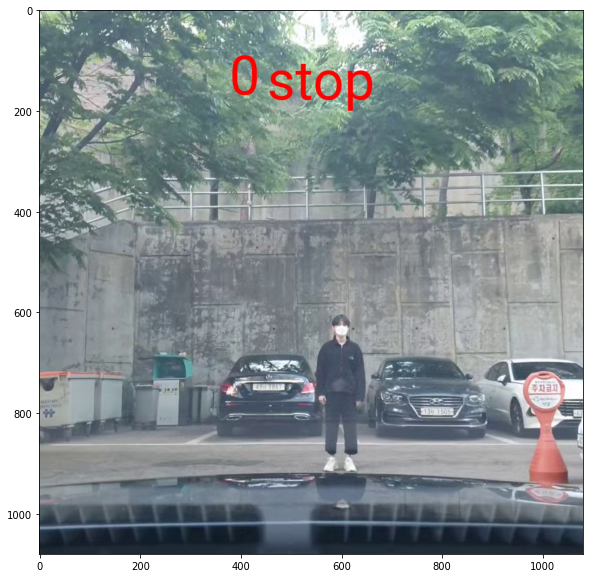

 12%|█▏        | 50/415.0 [00:05<00:28, 12.83it/s]

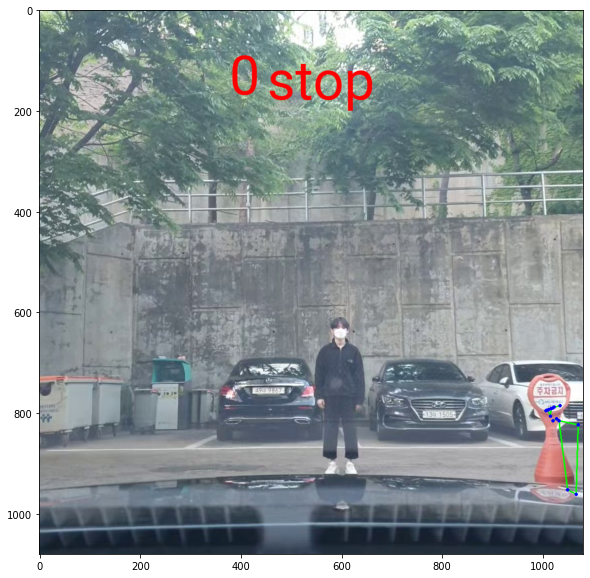

 24%|██▍       | 99/415.0 [00:09<00:25, 12.41it/s]

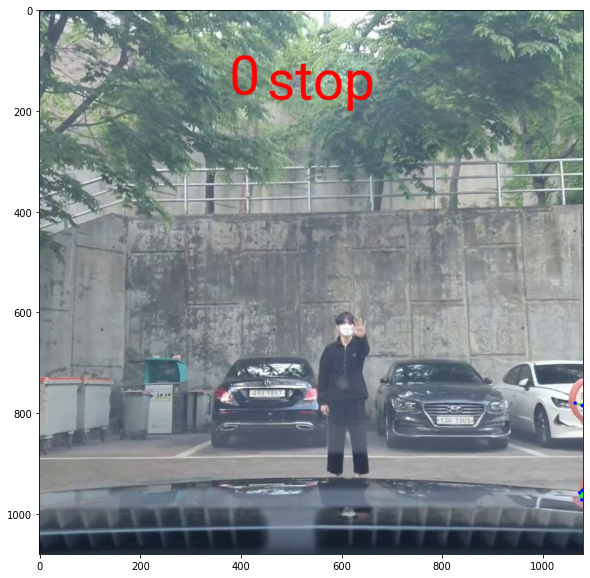

 36%|███▌      | 150/415.0 [00:14<00:21, 12.32it/s]

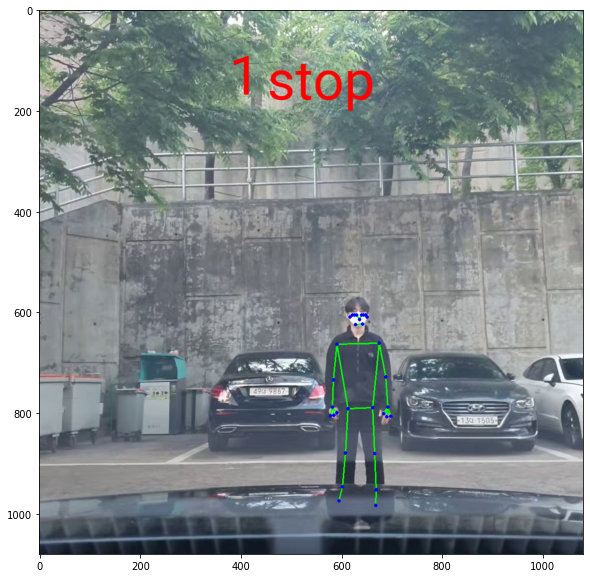

 48%|████▊     | 200/415.0 [00:19<00:18, 11.60it/s]

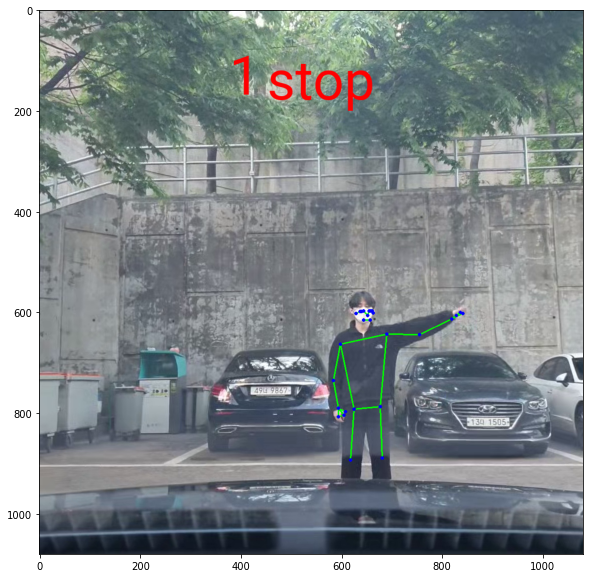

 60%|██████    | 249/415.0 [00:23<00:14, 11.72it/s]

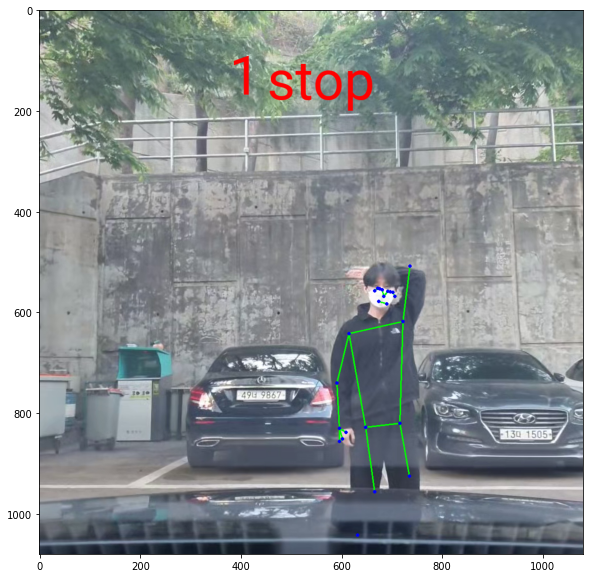

 72%|███████▏  | 299/415.0 [00:28<00:10, 11.17it/s]

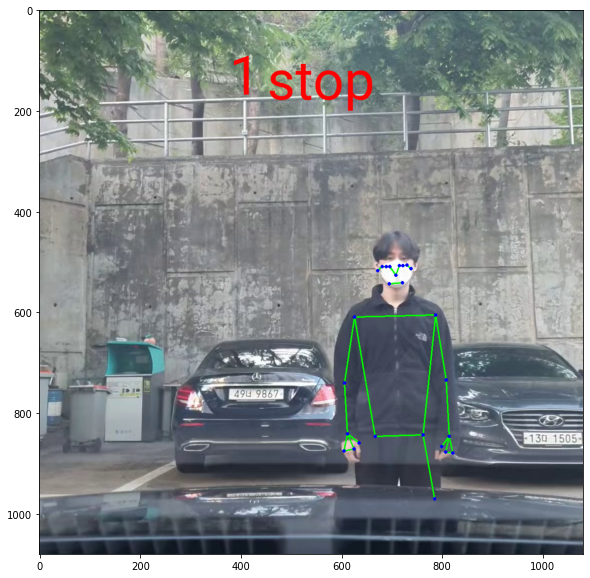

 84%|████████▍ | 350/415.0 [00:33<00:05, 11.67it/s]

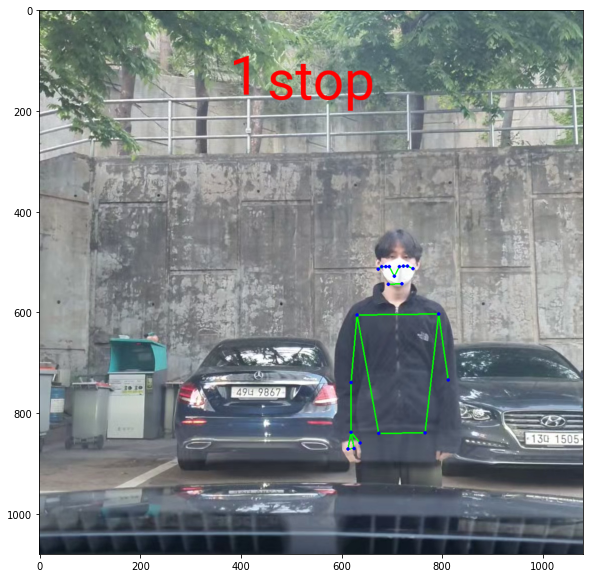

 96%|█████████▌| 399/415.0 [00:38<00:01, 11.32it/s]

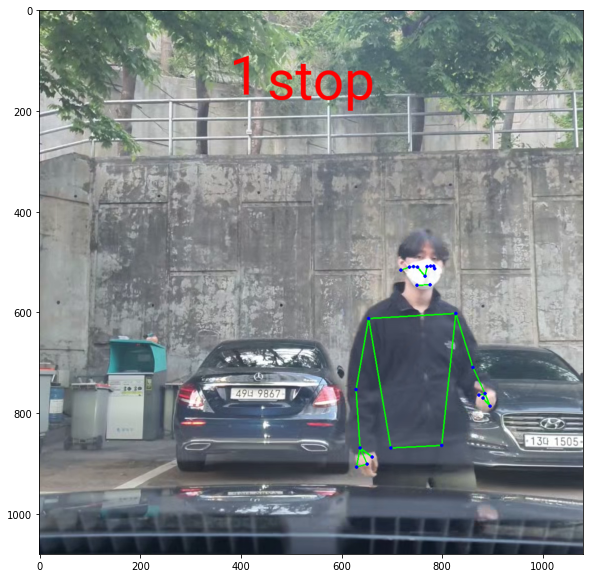

100%|██████████| 415/415.0 [00:40<00:00, 10.16it/s]


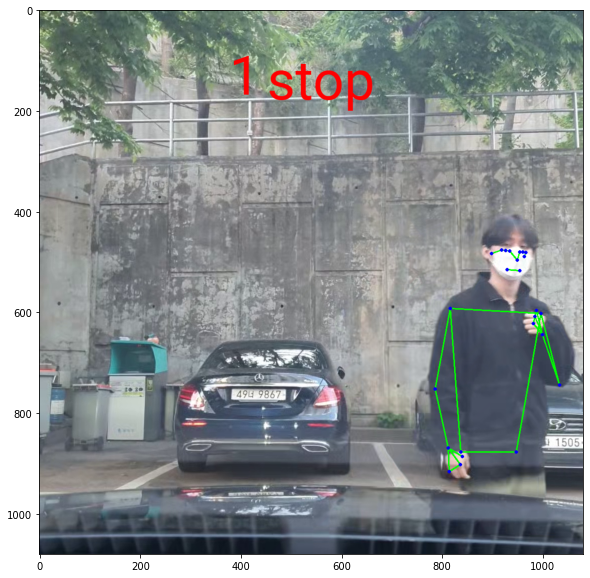

In [ ]:
#비디오에 분류기를 실행한다

import os
import tqdm
import numpy as np

from mediapipe.python.solutions import drawing_utils as mp_drawing


#출력 비디오를 정의한다.

out_video=cv2.VideoWriter(out_video_path, cv2.VideoWriter_fourcc(*'DIVX'), video_fps, (video_width, video_height))

frame_idx = 0
output_frame = None

with tqdm.tqdm(total=video_n_frames, position=0, leave=True) as pbar:
  while True:
    #영상의 매 frame을 불러온다.

    success, input_frame = video_cap.read()
    if not success:
      break

    #pose 추적기를 실행한다.
    input_frame = cv2.cvtColor(input_frame, cv2.COLOR_BGR2RGB)
    result = pose_tracker.process(image=input_frame)
    pose_landmarks = result.pose_landmarks

    #pose 예측을 그려준다.
    output_frame = input_frame.copy()
    if pose_landmarks is not None:
      mp_drawing.draw_landmarks(
          image=output_frame,
          landmark_list=pose_landmarks,
          connections=mp_pose.POSE_CONNECTIONS)
    
    if pose_landmarks is not None:

      #앞에서 정의한 영상에서 landmark을 보여준다.

      frame_height, frame_width = output_frame.shape[0], output_frame.shape[1]
      pose_landmarks = np.array([[lmk.x * frame_width, lmk.y * frame_height, lmk.z * frame_width]
                                 for lmk in pose_landmarks.landmark], dtype=np.float32)
      assert pose_landmarks.shape == (33, 3), 'Unexpected landmarks shape: {}'.format(pose_landmarks.shape)

      #현재 frame에서 보이는 그림에서 pose를 분류한다.
      pose_classification = pose_classifier(pose_landmarks)

      #Smooth classification using EMA.
      pose_classification_filtered = pose_classification_filter(pose_classification)

      #반복에 따른 count을 계산한다.
      repetitions_count = repetition_counter(pose_classification_filtered)
    else:
      
      #현재 frame에 분류된 pose가 없다면 none값을 준다.
      pose_classification = None

      #smoothing for future frames.
      pose_classification_filtered = pose_classification_filter(dict())
      pose_classification_filtered = None

      repetitions_count = repetition_counter.n_repeats

    #앞에서 정의한 frame에 대한 시각화를 실행한다.
    output_frame = pose_classification_visualizer(
        frame=output_frame,
        pose_classification=pose_classification,
        pose_classification_filtered=pose_classification_filtered,
        repetitions_count=repetitions_count)

    #out frame을 저장한다.
    out_video.write(cv2.cvtColor(np.array(output_frame), cv2.COLOR_RGB2BGR))


    if frame_idx % 50 == 0:
      show_image(output_frame)

    frame_idx += 1
    pbar.update()

#while문에 의한 모든 out frame을 저장한다.
out_video.release()

pose_tracker.close()

if output_frame is not None:
    show_image(output_frame)

In [ ]:
#생성한 비디오를 저장한다
files.download(out_video_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Classification visualizer for plus right to left sign
이 부분은 위의 코드와 동일한 부분이다. 현재 mediapipe에서는 한 가지 pose의 움직임에 대해서 classification하고 반복 count를 실시할 수 있다. 하지만 교통 수신호는 한 가지가 아니라 여러 가지가 존재한다. 현재는 mediapipe에서 두 가지 이상의 pose를 분류할 수 없지만 이 프로젝트에서는 개인적으로 두 가지 pose를 보고자 밑에 추가적으로 동일한 코드를 작성하였다. 

위의 정지 교통 수신호 코드와는 거의 동일하지만 훈련에 사용되는 이미지를 우측->좌측 으로 회전하는 교통 수신호를 입력으로 넣어주었다. 그에 따라 분류기는 우측->좌측 수신호를 pose로 인식하고 그에 따른 csv파일을 만들었다. 이 파일을 분류기에 적용하여 test영상에서도 해당 수신호를 받아 count하고 "right to left"라는 문구를 함께 띄웠다. 

결과영상에 대해서 정지 수신호와 우측/좌측 수신호의 분류기가 다르기 때문에 서로의 pose는 서로의 분류기에 영향을 주지 않았고 따로따로 분류됨을 볼 수 있었다.


In [ ]:
import io
from PIL import Image
from PIL import ImageFont
from PIL import ImageDraw
import requests

class PoseClassificationVisualizer(object):
  """Keeps track of claassifcations for every frame and renders them."""

  def __init__(self,
               class_name,
               plot_location_x=0.05,
               plot_location_y=0.05,
               plot_max_width=0.4,
               plot_max_height=0.4,
               plot_figsize=(9, 4),
               plot_x_max=None,
               plot_y_max=None,
               #counter_location_x=0.85,
               counter_location_x=0.35,
               counter_location_y=0.15,
               counter_font_path='https://github.com/googlefonts/roboto/blob/main/src/hinted/Roboto-Regular.ttf?raw=true',
               counter_font_color='red',
               #counter_font_size=0.15):
               counter_font_size=0.068):
    self._class_name = class_name
    self._plot_location_x = plot_location_x
    self._plot_location_y = plot_location_y
    self._plot_max_width = plot_max_width
    self._plot_max_height = plot_max_height
    self._plot_figsize = plot_figsize
    self._plot_x_max = plot_x_max
    self._plot_y_max = plot_y_max
    self._counter_location_x = counter_location_x
    self._counter_location_y = counter_location_y
    self._counter_font_path = counter_font_path
    self._counter_font_color = counter_font_color
    self._counter_font_size = counter_font_size

    self._counter_font = None

    self._pose_classification_history = []
    self._pose_classification_filtered_history = []

  def __call__(self,
               frame,
               pose_classification,
               pose_classification_filtered,
               repetitions_count):
    """Renders pose classifcation and counter until given frame."""
    # Extend classification history.
    self._pose_classification_history.append(pose_classification)
    self._pose_classification_filtered_history.append(pose_classification_filtered)

    # Output frame with classification plot and counter.
    output_img = Image.fromarray(frame)

    output_width = output_img.size[0]
    output_height = output_img.size[1]

    # Draw the plot.
    #img = self._plot_classification_history(output_width, output_height)
    #img.thumbnail((int(output_width * self._plot_max_width),
    #               int(output_height * self._plot_max_height)),
    #              Image.ANTIALIAS)
    #output_img.paste(img,
    #                 (int(output_width * self._plot_location_x),
    #                  int(output_height * self._plot_location_y)))

    # Draw the count.
    output_img_draw = ImageDraw.Draw(output_img)
    if self._counter_font is None:
      font_size = int(output_height * self._counter_font_size)
      font_request = requests.get(self._counter_font_path, allow_redirects=True)
      self._counter_font = ImageFont.truetype(io.BytesIO(font_request.content), size=font_size)
    output_img_draw.text((output_width * self._counter_location_x,
                          output_height * self._counter_location_y),
                         #str(repetitions_count),
                         str(repetitions_count),
                         font=self._counter_font,
                         fill=self._counter_font_color)
    # draw the stop.
    output_img_draw.text((output_width *1.2 * self._counter_location_x,    #내가 추가
                          output_height *1.2 * self._counter_location_y),
                         #str(repetitions_count),
                         str('right to left'),
                         font=self._counter_font,
                         fill=self._counter_font_color)
   

    return output_img

  def _plot_classification_history(self, output_width, output_height):
    fig = plt.figure(figsize=self._plot_figsize)

    for classification_history in [self._pose_classification_history,
                                   self._pose_classification_filtered_history]:
      y = []
      for classification in classification_history:
        if classification is None:
          y.append(None)
        elif self._class_name in classification:
          y.append(classification[self._class_name])
        else:
          y.append(0)
      plt.plot(y, linewidth=7)

    plt.grid(axis='y', alpha=0.75)
    plt.xlabel('Frame')
    plt.ylabel('Confidence')
    plt.title('Classification history for `{}`'.format(self._class_name))
    plt.legend(loc='upper right')

    if self._plot_y_max is not None:
      plt.ylim(top=self._plot_y_max)
    if self._plot_x_max is not None:
      plt.xlim(right=self._plot_x_max)

    # Convert plot to image.
    buf = io.BytesIO()
    dpi = min(
        output_width * self._plot_max_width / float(self._plot_figsize[0]),
        output_height * self._plot_max_height / float(self._plot_figsize[1]))
    fig.savefig(buf, dpi=dpi)
    buf.seek(0)
    img = Image.open(buf)
    plt.close()

    return img

## Bootstrap helper for plus right to left sign

In [ ]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
from PIL import Image
import sys
import tqdm

from mediapipe.python.solutions import drawing_utils as mp_drawing
from mediapipe.python.solutions import pose as mp_pose


class BootstrapHelper(object):
  """Helps to bootstrap images and filter pose samples for classification."""

  def __init__(self,
               images_in_folder,
               images_out_folder,
               csvs_out_folder):
    self._images_in_folder = images_in_folder
    self._images_out_folder = images_out_folder
    self._csvs_out_folder = csvs_out_folder

    # Get list of pose classes and print image statistics.
    self._pose_class_names = sorted([n for n in os.listdir(self._images_in_folder) if not n.startswith('.')])
    
  def bootstrap(self, per_pose_class_limit=None):
    """Bootstraps images in a given folder.
    
    Required image in folder (same use for image out folder):
      pushups_up/
        image_001.jpg
        image_002.jpg
        ...
      pushups_down/
        image_001.jpg
        image_002.jpg
        ...
      ...

    Produced CSVs out folder:
      pushups_up.csv
      pushups_down.csv

    Produced CSV structure with pose 3D landmarks:
      sample_00001,x1,y1,z1,x2,y2,z2,....
      sample_00002,x1,y1,z1,x2,y2,z2,....
    """
    # Create output folder for CVSs.
    if not os.path.exists(self._csvs_out_folder):
      os.makedirs(self._csvs_out_folder)

    for pose_class_name in self._pose_class_names:
      print('Bootstrapping ', pose_class_name, file=sys.stderr)

      # Paths for the pose class.
      images_in_folder = os.path.join(self._images_in_folder, pose_class_name)
      images_out_folder = os.path.join(self._images_out_folder, pose_class_name)
      csv_out_path = os.path.join(self._csvs_out_folder, pose_class_name + '.csv')
      if not os.path.exists(images_out_folder):
        os.makedirs(images_out_folder)

      with open(csv_out_path, 'w') as csv_out_file:
        csv_out_writer = csv.writer(csv_out_file, delimiter=',', quoting=csv.QUOTE_MINIMAL)
        # Get list of images.
        image_names = sorted([n for n in os.listdir(images_in_folder) if not n.startswith('.')])
        if per_pose_class_limit is not None:
          image_names = image_names[:per_pose_class_limit]

        # Bootstrap every image.
        for image_name in tqdm.tqdm(image_names):
          # Load image.
          input_frame = cv2.imread(os.path.join(images_in_folder, image_name))
          input_frame = cv2.cvtColor(input_frame, cv2.COLOR_BGR2RGB)

          # Initialize fresh pose tracker and run it.
          with mp_pose.Pose(upper_body_only=False) as pose_tracker:
            result = pose_tracker.process(image=input_frame)
            pose_landmarks = result.pose_landmarks

          # Save image with pose prediction (if pose was detected).
          output_frame = input_frame.copy()
          if pose_landmarks is not None:
            mp_drawing.draw_landmarks(
                image=output_frame,
                landmark_list=pose_landmarks,
                connections=mp_pose.POSE_CONNECTIONS)
          output_frame = cv2.cvtColor(output_frame, cv2.COLOR_RGB2BGR)
          cv2.imwrite(os.path.join(images_out_folder, image_name), output_frame)
          
          # Save landmarks if pose was detected.
          if pose_landmarks is not None:
            # Get landmarks.
            frame_height, frame_width = output_frame.shape[0], output_frame.shape[1]
            pose_landmarks = np.array(
                [[lmk.x * frame_width, lmk.y * frame_height, lmk.z * frame_width]
                 for lmk in pose_landmarks.landmark],
                dtype=np.float32)
            assert pose_landmarks.shape == (33, 3), 'Unexpected landmarks shape: {}'.format(pose_landmarks.shape)
            csv_out_writer.writerow([image_name] + pose_landmarks.flatten().astype(np.str).tolist())

          # Draw XZ projection and concatenate with the image.
          projection_xz = self._draw_xz_projection(
              output_frame=output_frame, pose_landmarks=pose_landmarks)
          output_frame = np.concatenate((output_frame, projection_xz), axis=1)

  def _draw_xz_projection(self, output_frame, pose_landmarks, r=0.5, color='red'):
    frame_height, frame_width = output_frame.shape[0], output_frame.shape[1]
    img = Image.new('RGB', (frame_width, frame_height), color='white')

    if pose_landmarks is None:
      return np.asarray(img)

    # Scale radius according to the image width.
    r *= frame_width * 0.01

    draw = ImageDraw.Draw(img)
    for idx_1, idx_2 in mp_pose.POSE_CONNECTIONS:
      # Flip Z and move hips center to the center of the image.
      x1, y1, z1 = pose_landmarks[idx_1] * [1, 1, -1] + [0, 0, frame_height * 0.5]
      x2, y2, z2 = pose_landmarks[idx_2] * [1, 1, -1] + [0, 0, frame_height * 0.5]

      draw.ellipse([x1 - r, z1 - r, x1 + r, z1 + r], fill=color)
      draw.ellipse([x2 - r, z2 - r, x2 + r, z2 + r], fill=color)
      draw.line([x1, z1, x2, z2], width=int(r), fill=color)

    return np.asarray(img)

  def align_images_and_csvs(self, print_removed_items=False):
    """Makes sure that image folders and CSVs have the same sample.
    
    Leaves only intersetion of samples in both image folders and CSVs.
    """
    for pose_class_name in self._pose_class_names:
      # Paths for the pose class.
      images_out_folder = os.path.join(self._images_out_folder, pose_class_name)
      csv_out_path = os.path.join(self._csvs_out_folder, pose_class_name + '.csv')

      # Read CSV into memory.
      rows = []
      with open(csv_out_path) as csv_out_file:
        csv_out_reader = csv.reader(csv_out_file, delimiter=',')
        for row in csv_out_reader:
          rows.append(row)

      # Image names left in CSV.
      image_names_in_csv = []

      # Re-write the CSV removing lines without corresponding images.
      with open(csv_out_path, 'w') as csv_out_file:
        csv_out_writer = csv.writer(csv_out_file, delimiter=',', quoting=csv.QUOTE_MINIMAL)
        for row in rows:
          image_name = row[0]
          image_path = os.path.join(images_out_folder, image_name)
          if os.path.exists(image_path):
            image_names_in_csv.append(image_name)
            csv_out_writer.writerow(row)
          elif print_removed_items:
            print('Removed image from CSV: ', image_path)

      # Remove images without corresponding line in CSV.
      for image_name in os.listdir(images_out_folder):
        if image_name not in image_names_in_csv:
          image_path = os.path.join(images_out_folder, image_name)
          os.remove(image_path)
          if print_removed_items:
            print('Removed image from folder: ', image_path)

  def analyze_outliers(self, outliers):
    """Classifies each sample agains all other to find outliers.
    
    If sample is classified differrrently than the original class - it sould
    either be deleted or more similar samples should be aadded.
    """
    for outlier in outliers:
      image_path = os.path.join(self._images_out_folder, outlier.sample.class_name, outlier.sample.name)

      print('Outlier')
      print('  sample path =    ', image_path)
      print('  sample class =   ', outlier.sample.class_name)
      print('  detected class = ', outlier.detected_class)
      print('  all classes =    ', outlier.all_classes)

      img = cv2.imread(image_path)
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      show_image(img, figsize=(20, 20))

  def remove_outliers(self, outliers):
    """Removes outliers from the image folders."""
    for outlier in outliers:
      image_path = os.path.join(self._images_out_folder, outlier.sample.class_name, outlier.sample.name)
      os.remove(image_path)

  def print_images_in_statistics(self):
    """Prints statistics from the input image folder."""
    self._print_images_statistics(self._images_in_folder, self._pose_class_names)

  def print_images_out_statistics(self):
    """Prints statistics from the output image folder."""
    self._print_images_statistics(self._images_out_folder, self._pose_class_names)

  def _print_images_statistics(self, images_folder, pose_class_names):
    print('Number of images per pose class:')
    for pose_class_name in pose_class_names:
      n_images = len([
          n for n in os.listdir(os.path.join(images_folder, pose_class_name))
          if not n.startswith('.')])
      print('  {}: {}'.format(pose_class_name, n_images))

In [ ]:
import zipfile
import io

zf = zipfile.ZipFile("/content/drive/MyDrive/Colab_Notebooks/차량지능기초/mediapipe/traffic_poses_images_in2.zip","r")
zf.extractall()
os.listdir('.')

['.config',
 'traffic_poses_csvs_out.csv',
 'traffic_poses_images_in',
 'traffic_poses_csvs_out',
 'drive',
 'trafficsign-test.mp4',
 'trafficsign-test-out.mp4',
 'traffic_poses_images_in2',
 'traffic_poses_images_out',
 'sample_data']

## Bootstrap images for plus right to left sign

In [ ]:
# 기존의 bootstrap이미지는 pushup 이미지였다면 여기서는 traffic_poses 이미지로 모두 바꾸었다.
# 해당 zip파일에는 traffic_poses가 두 폴더로 나뉘어 정지 신호에 대한 두 가지 동작을 보여주고 있다.

bootstrap_images_in_folder = 'traffic_poses_images_in2'

#bootstrapped된 이미지와 CSV파일가 있는 출력 폴더를 설정한다.
bootstrap_images_out_folder = 'traffic_poses_images_out'
bootstrap_csvs_out_folder = 'traffic_poses_csvs_out'

#helper을 초기화시킨다.
bootstrap_helper = BootstrapHelper(
    images_in_folder=bootstrap_images_in_folder,
    images_out_folder=bootstrap_images_out_folder,
    csvs_out_folder=bootstrap_csvs_out_folder,
)

#가능한 pose 클래스와 이미지를 확인한다.
bootstrap_helper.print_images_in_statistics()

#모든 이미지에 대해 bootstrap을 실행한다
bootstrap_helper.bootstrap(per_pose_class_limit=None)

#가능한 bootstrap이미지를 설정한다.
bootstrap_helper.print_images_out_statistics()

bootstrap_helper.align_images_and_csvs(print_removed_items=False)
bootstrap_helper.print_images_out_statistics()

Bootstrapping  trafficsign_left
  0%|          | 0/10 [00:00<?, ?it/s]

Number of images per pose class:
  trafficsign_left: 10
  trafficsign_right: 10


100%|██████████| 10/10 [00:06<00:00,  1.62it/s]
Bootstrapping  trafficsign_right
100%|██████████| 10/10 [00:06<00:00,  1.66it/s]

Number of images per pose class:
  trafficsign_left: 10
  trafficsign_right: 10
Number of images per pose class:
  trafficsign_left: 10
  trafficsign_right: 10


In [ ]:
#filter된 이미지에 CSV를 적용시킨다
bootstrap_helper.align_images_and_csvs(print_removed_items=False)
bootstrap_helper.print_images_out_statistics()

Number of images per pose class:
  trafficsign_left: 10
  trafficsign_right: 10


In [ ]:
#outlier을 찾아주는 작업이다.

#pose landmark을 구현화시키기 위해 변환시킨다
pose_embedder = FullBodyPoseEmbedder()

#pose데이터에 분류기를 적용한다
pose_classifier = PoseClassifier(
    pose_samples_folder=bootstrap_csvs_out_folder,
    pose_embedder=pose_embedder,
    top_n_by_max_distance=30,
    top_n_by_mean_distance=10)

outliers = pose_classifier.find_pose_sample_outliers()
print('Number of outliers: ', len(outliers))

#outliers을 분석한다.
bootstrap_helper.analyze_outliers(outliers)

#분류되지 않는 오류 outliers들을 제거한다
bootstrap_helper.remove_outliers(outliers)

#outlier들을 제거한 후에 모든 이미지에 CSV를 적용한다
bootstrap_helper.align_images_and_csvs(print_removed_items=False)
bootstrap_helper.print_images_out_statistics()

Number of outliers:  0
Number of images per pose class:
  trafficsign_left: 10
  trafficsign_right: 10


In [ ]:
import csv
import os
import numpy as np


def dump_for_the_app():
  pose_samples_folder = 'traffic_poses_csvs_out'
  pose_samples_csv_path = 'traffic_poses_csvs_out.csv'
  file_extension = 'csv'
  file_separator = ','

  #폴더의 각 파일은 하나의 pose 클래스를 나타낸다..
  file_names = [name for name in os.listdir(pose_samples_folder) if name.endswith(file_extension)]

  with open(pose_samples_csv_path, 'w') as csv_out:
    csv_out_writer = csv.writer(csv_out, delimiter=file_separator, quoting=csv.QUOTE_MINIMAL)
    for file_name in file_names:
      #파일 이름을 pose class의 이름으로 나타낸다.
      class_name = file_name[:-(len(file_extension) + 1)]

      with open(os.path.join(pose_samples_folder, file_name)) as csv_in:
        csv_in_reader = csv.reader(csv_in, delimiter=file_separator)
        for row in csv_in_reader:
          row.insert(1, class_name)
          csv_out_writer.writerow(row)

  files.download(pose_samples_csv_path)


dump_for_the_app()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#불러오는 test 비디오의 경로를 저장하고 반복 count에 활용할 class의 폴더 이름을 작성한다
video_path = 'trafficsign-test-out.mp4'
class_name='trafficsign_left'
out_video_path = 'trafficsign-test-out-2.mp4'

In [ ]:
#test 비디오를 불러 실행한다.
import cv2

video_cap = cv2.VideoCapture(video_path)

#비디오의 기본 파라미터들을 output영상에 사용하기 위해 불러온다.
video_n_frames = video_cap.get(cv2.CAP_PROP_FRAME_COUNT)
video_fps = video_cap.get(cv2.CAP_PROP_FPS)
video_width = int(video_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
video_height = int(video_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print(video_n_frames)
print(video_fps)

415.0
30.0


In [ ]:
#tracker, classifier and counter들을 초기화한다.
#이는 매 영상을 분류할 때 마다 새로이 초기화하는 작업이다.
from mediapipe.python.solutions import pose as mp_pose


#pose클래스 CSV를 폴더에 넣는다. 후에 분류기를 작성하며 출력 CSV를 만든다
pose_samples_folder = 'traffic_poses_csvs_out'

#tracker, classifier and counter들을 초기화한다.

pose_tracker = mp_pose.Pose(upper_body_only=False)

#구현기를 초기화한다.
pose_embedder = FullBodyPoseEmbedder()

#분류기를 초기화한다.
#bootstrapping중 같은 파라미터들을 확인하는지 체크한다
pose_classifier = PoseClassifier(
    pose_samples_folder=pose_samples_folder,
    pose_embedder=pose_embedder,
    top_n_by_max_distance=30,
    top_n_by_mean_distance=10)

#EMA smoothing을 초기화한다.
pose_classification_filter = EMADictSmoothing(
    window_size=10,
    alpha=0.2)

#counter을 초기화한다.
repetition_counter = RepetitionCounter(
    class_name=class_name,
    enter_threshold=6,
    exit_threshold=4)

#renderer을 초기화한다.
pose_classification_visualizer = PoseClassificationVisualizer(
    class_name=class_name,
    plot_x_max=video_n_frames,
    # Graphic looks nicer if it's the same as `top_n_by_mean_distance`.
    plot_y_max=10)

  0%|          | 0/415.0 [00:00<?, ?it/s]

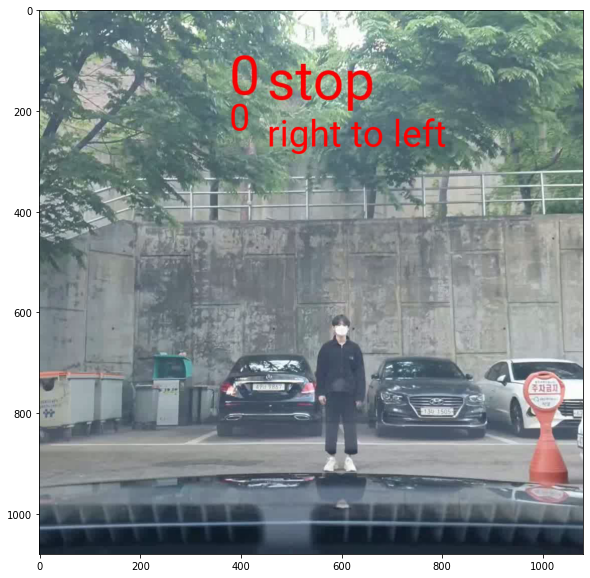

 12%|█▏        | 49/415.0 [00:04<00:27, 13.13it/s]

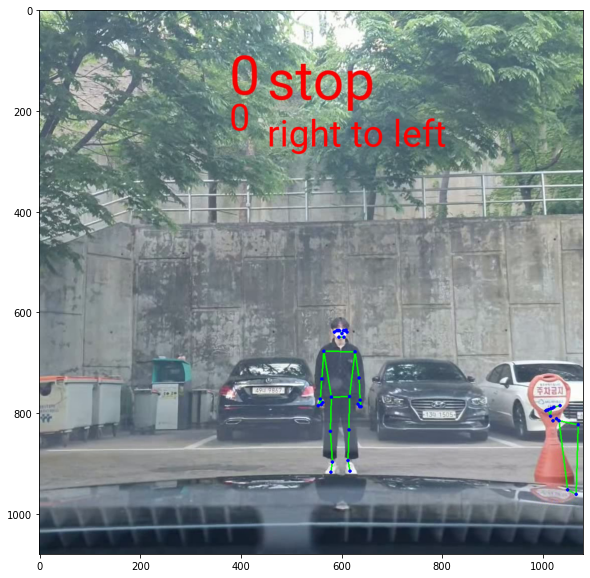

 24%|██▍       | 99/415.0 [00:09<00:25, 12.53it/s]

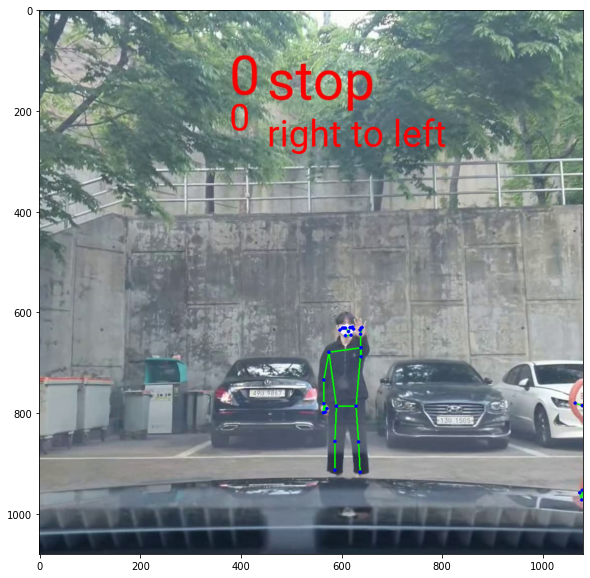

 36%|███▌      | 149/415.0 [00:13<00:21, 12.64it/s]

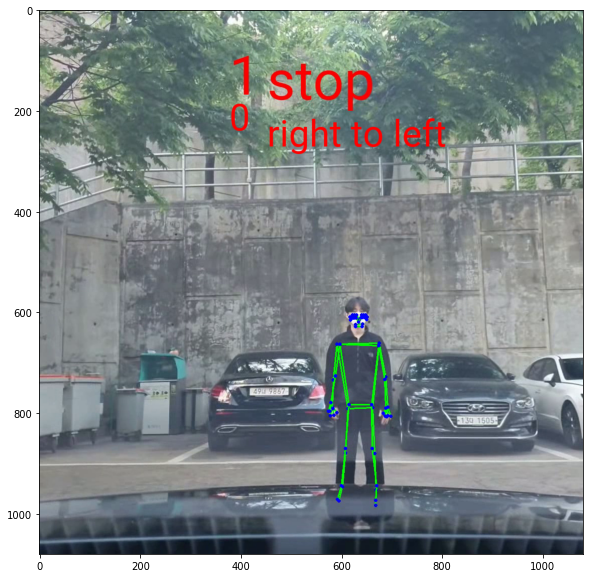

 48%|████▊     | 199/415.0 [00:18<00:17, 12.37it/s]

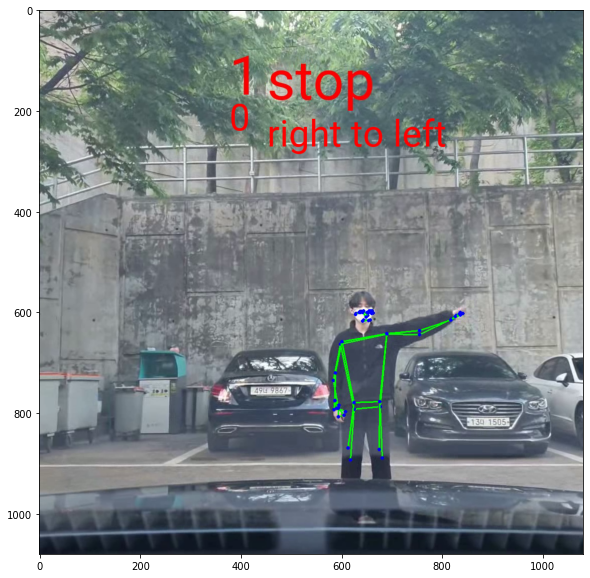

 60%|██████    | 250/415.0 [00:23<00:13, 11.82it/s]

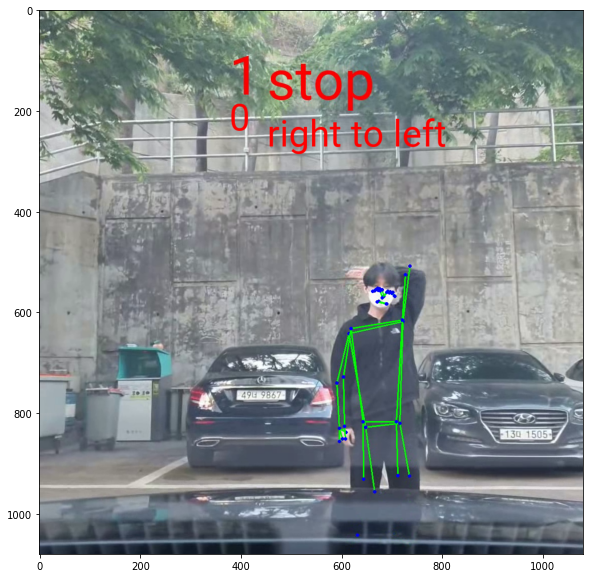

 72%|███████▏  | 299/415.0 [00:27<00:09, 11.99it/s]

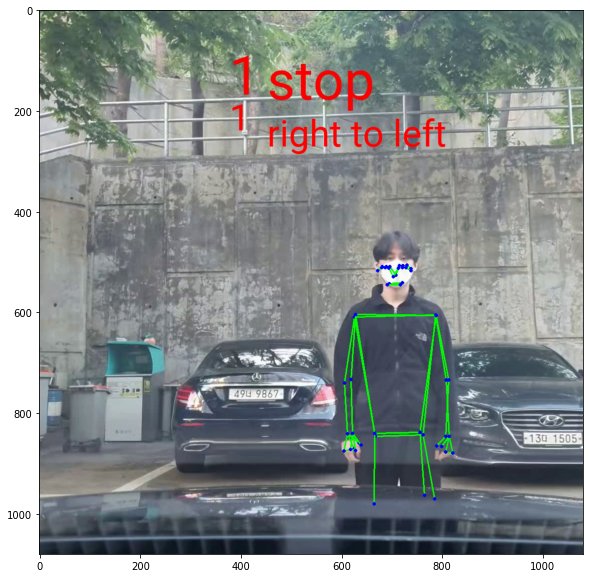

 84%|████████▍ | 349/415.0 [00:32<00:05, 11.60it/s]

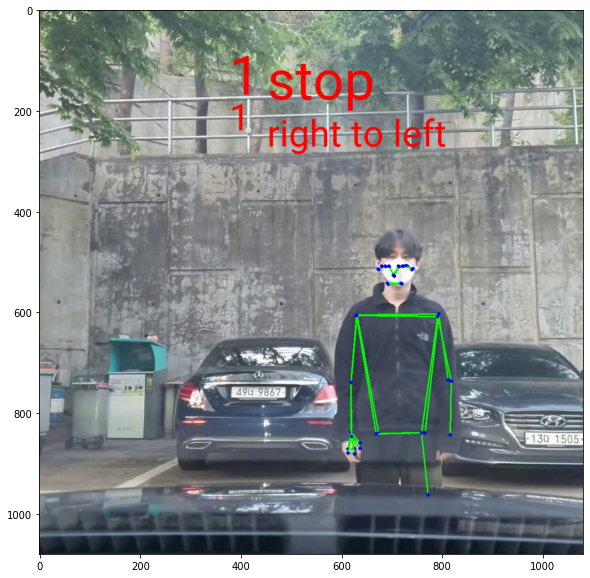

 96%|█████████▌| 399/415.0 [00:37<00:01, 11.74it/s]

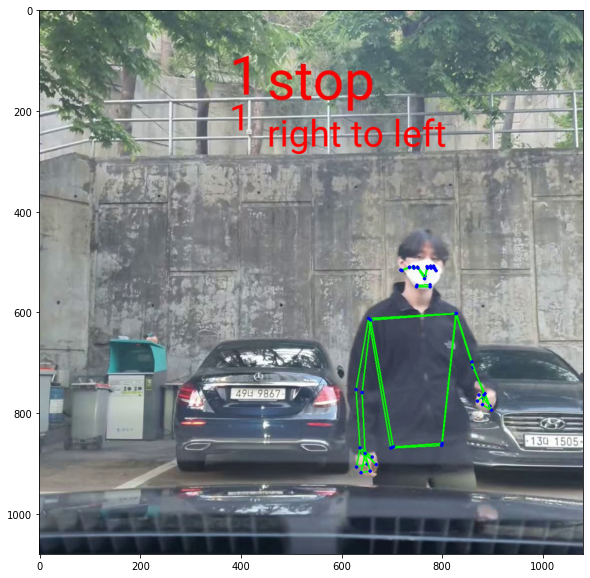

100%|██████████| 415/415.0 [00:39<00:00, 10.43it/s]


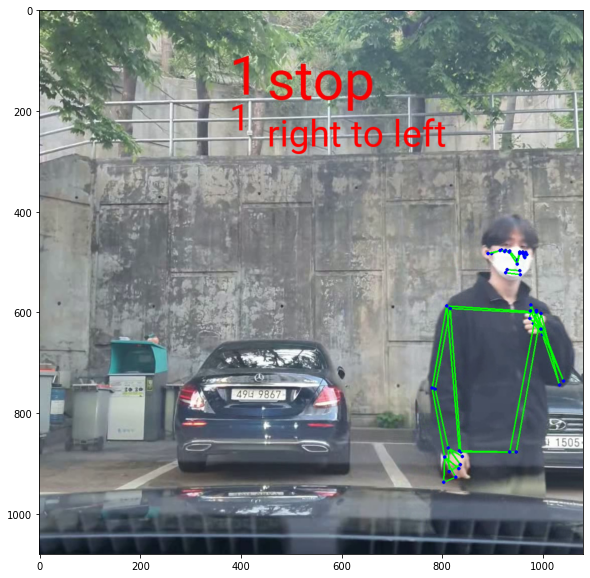

In [ ]:
#비디오에 분류기를 실행한다
import os
import tqdm
import numpy as np

from mediapipe.python.solutions import drawing_utils as mp_drawing


#출력 비디오를 정의한다.
out_video=cv2.VideoWriter(out_video_path, cv2.VideoWriter_fourcc(*'DIVX'), video_fps, (video_width, video_height))

frame_idx = 0
output_frame = None

with tqdm.tqdm(total=video_n_frames, position=0, leave=True) as pbar:
  while True:
    #영상의 매 frame을 불러온다.
    success, input_frame = video_cap.read()
    if not success:
      break

    #pose 추적기를 실행한다.
    input_frame = cv2.cvtColor(input_frame, cv2.COLOR_BGR2RGB)
    result = pose_tracker.process(image=input_frame)
    pose_landmarks = result.pose_landmarks

    #pose 예측을 그려준다.
    output_frame = input_frame.copy()
    if pose_landmarks is not None:
      mp_drawing.draw_landmarks(
          image=output_frame,
          landmark_list=pose_landmarks,
          connections=mp_pose.POSE_CONNECTIONS)
    
    if pose_landmarks is not None:
      #앞에서 정의한 영상에서 landmark을 보여준다.
      frame_height, frame_width = output_frame.shape[0], output_frame.shape[1]
      pose_landmarks = np.array([[lmk.x * frame_width, lmk.y * frame_height, lmk.z * frame_width]
                                 for lmk in pose_landmarks.landmark], dtype=np.float32)
      assert pose_landmarks.shape == (33, 3), 'Unexpected landmarks shape: {}'.format(pose_landmarks.shape)

      #현재 frame에서 보이는 그림에서 pose를 분류한다.
      pose_classification = pose_classifier(pose_landmarks)

      #EMA을 사용해서 분류를 smoothing하게 한다.
      pose_classification_filtered = pose_classification_filter(pose_classification)

      #반복에 따른 count을 계산한다.
      repetitions_count = repetition_counter(pose_classification_filtered)
    else:
      #현재 frame에 분류된 pose가 없다면 none값을 준다.
      pose_classification = None

      #불안하거나 빈 분류기에 대해서 재확인작업을 진행한다
      #다음 frame에 대해서도 smoothing을 진행한다
      pose_classification_filtered = pose_classification_filter(dict())
      pose_classification_filtered = None

      #대상 pose가 움직이지 않을 시에는 count를 업데이트 하지 않고 이전 count을 이용한다
      repetitions_count = repetition_counter.n_repeats

    ##앞에서 정의한 frame에 대한 시각화를 실행한다.
    output_frame = pose_classification_visualizer(
        frame=output_frame,
        pose_classification=pose_classification,
        pose_classification_filtered=pose_classification_filtered,
        repetitions_count=repetitions_count)

    ##out frame을 저장한다..
    out_video.write(cv2.cvtColor(np.array(output_frame), cv2.COLOR_RGB2BGR))

#video 트랙킹에 의한 모든 frame에 대해 실시한다.
    if frame_idx % 50 == 0:
      show_image(output_frame)

    frame_idx += 1
    pbar.update()

#while문에 의한 모든 out frame을 저장한다.
out_video.release()

pose_tracker.close()

if output_frame is not None:
    show_image(output_frame)